In [1]:
import model_torch
import modules_torch
import _utils_torch
from Preprocessing import *
from _utils_torch import *
import loss

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

print(torch.cuda.is_available())

True


In [3]:
data_dir = '../Data'
list_dir = os.listdir(data_dir)

train_dir = list_dir[int(np.round(len(list_dir)*0.6)):]
test_dir = list_dir[:int(np.round(len(list_dir)*0.4))]

val_dir = test_dir[:int(np.round(len(test_dir)*0.5))]
test_dir = test_dir[int(np.round(len(test_dir)*0.5)):]

X_test = []
Y_test = []
for item in tqdm(test_dir):
    sam_img = data_dir + '/' + item + '/img.nii'
    sam_mask = sam_img.replace('img', 'mask')

    sam_img = sitk.ReadImage(sam_img)
    sam_mask = sitk.ReadImage(sam_mask)

    assert sam_img.GetSize() == sam_mask.GetSize()

    sam_img = sitk.GetArrayFromImage(sam_img)
    sam_mask = sitk.GetArrayFromImage(sam_mask)
    sam_img = normalize_dcm(sam_img)
    print(sam_img.min(), sam_img.max(), sam_img.dtype)
    
    for _slice in range(len(sam_img)):
        X_test.append(sam_img[_slice,...])
        Y_test.append(sam_mask[_slice,...])

X_test = np.array(X_test)
Y_test = np.array(Y_test)

print(X_test.shape, X_test.min(), X_test.max(), X_test.dtype)
print(Y_test.shape, Y_test.min(), Y_test.max(), Y_test.dtype)

  0%|          | 0/6 [00:00<?, ?it/s]

0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
(1426, 512, 512) 0.0 1.0 float32
(1426, 512, 512) 0 1 int16


In [4]:
print('Test Labels:')
unique, counts = np.unique(Y_test, return_counts=1)
print(dict(zip(unique, counts)))

Test Labels:
{0: 373696511, 1: 120833}


In [5]:
h_params=EasyDict()
h_params.gpu_num=0
h_params.seed=42
h_params.batch_size=8
h_params.model_name = "./output/model.pth"
h_params.model_save_base = os.path.join(os.getcwd(),"./output/train_log")
device = torch.device(f"cuda:{h_params.gpu_num}" if torch.cuda.is_available() else 'cpu')

In [6]:
val_transform = A.Compose([
    A.Resize(width=512, height=512),
    ToTensorV2(),
], p=1)

In [7]:
test_dataset = custom_dataset(img=X_test,
                              mask=Y_test,
                              transform=val_transform)

test_dataloader = DataLoader(dataset=test_dataset,
                             batch_size=h_params.batch_size,
                             shuffle=False)

In [8]:
model = model_torch.Unet(
    encoder_name='efficientnet-b1',
    encoder_depth=5,
    encoder_weights=None,
    in_channels=1, 
    classes=1,
    activation=None,
    )
model = model.to(device)
check_point_path = h_params.model_name
check_point = torch.load(check_point_path)
model.load_state_dict(check_point)

<All keys matched successfully>

In [9]:
x_test = []
y_test = []
pred_test = []

model.eval()
with torch.no_grad():
    for data in tqdm(test_dataloader,total=len(test_dataloader),position=0,desc='Test',colour='green'):
        
        image = data['image'].to(device, dtype=torch.float)
        target = data['mask'].to(device, dtype=torch.long)
        
        y_pred = model(image).sigmoid()

        for idx in range(len(image)):
            idx_image = image[idx]
            idx_target = target[idx]
            idx_pred = y_pred[idx]
            x_test.append(idx_image.cpu().numpy().astype(np.float16)[0,...])
            y_test.append(idx_target.cpu().numpy().astype(np.longlong))
            pred_test.append(idx_pred.cpu().numpy()[0,...])
        
        
x_test = np.array(x_test)
y_test = np.array(y_test)
pred_test = np.array(pred_test)

pred_test[pred_test>.5] = 1
pred_test[pred_test<=.5] = 0

print(x_test.shape, x_test.min(), x_test.max(), x_test.dtype)
print(y_test.shape, y_test.min(), y_test.max(), y_test.dtype)
print(pred_test.shape, pred_test.min(), pred_test.max(), pred_test.dtype)

Test:   0%|          | 0/179 [00:00<?, ?it/s]

(1426, 512, 512) 0.0 1.0 float16
(1426, 512, 512) 0 1 int64
(1426, 512, 512) 0.0 1.0 float32


In [10]:
from sklearn.metrics import f1_score, precision_score, recall_score

num_class = 1

tot_precision, tot_recall, tot_dice = [], [], []
for idx in tqdm(range(len(x_test))):
    sam_gt = y_test[idx,...].flatten().astype(np.uint8)
    sam_pred = pred_test[idx,...].flatten().astype(np.uint8)

    if sam_gt.max()==0 and sam_pred.max()==0:
        sam_precision = np.nan
        sam_recall = np.nan
        sam_dice = np.nan

        tot_precision.append(sam_precision)
        tot_recall.append(sam_recall)
        tot_dice.append(sam_dice)
        
    else:
        sam_precision = precision_score(sam_gt, sam_pred, average=None, zero_division=np.nan)
        sam_recall = recall_score(sam_gt, sam_pred, average=None, zero_division=np.nan)
        sam_dice = f1_score(sam_gt, sam_pred, average=None, zero_division=np.nan)
        
        tot_precision.append(sam_precision[num_class])
        tot_recall.append(sam_recall[num_class])
        tot_dice.append(sam_dice[num_class])

tot_precision, tot_recall, tot_dice = np.array(tot_precision), np.array(tot_recall), np.array(tot_dice)

print('precision')
print(np.nanmean(tot_precision), np.nanstd(tot_precision))
print('\n')
print('recall')
print(np.nanmean(tot_recall), np.nanstd(tot_recall))
print('\n')
print('DSC')
print(np.nanmean(tot_dice), np.nanstd(tot_dice))

  0%|          | 0/1426 [00:00<?, ?it/s]

precision
0.9258626102445697 0.11372271559158147


recall
0.8843069875234791 0.21025405779546555


DSC
0.877118555864621 0.21856495377946175


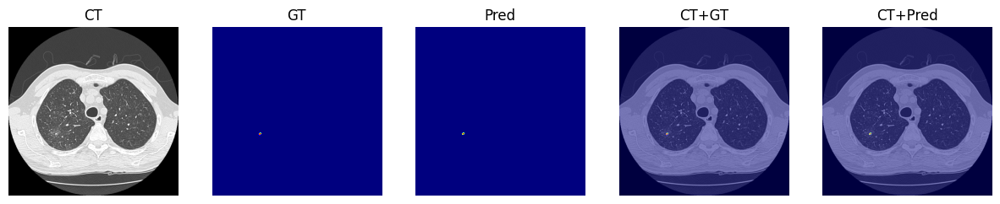

GT: 0 1
Pred: 0.0 1.0


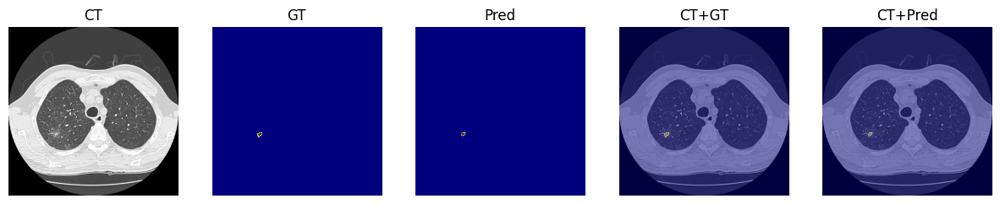

GT: 0 1
Pred: 0.0 1.0


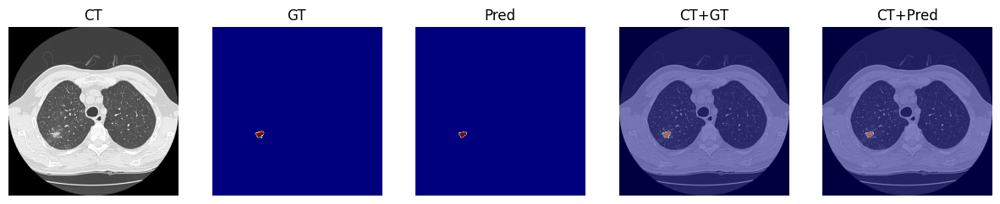

GT: 0 1
Pred: 0.0 1.0


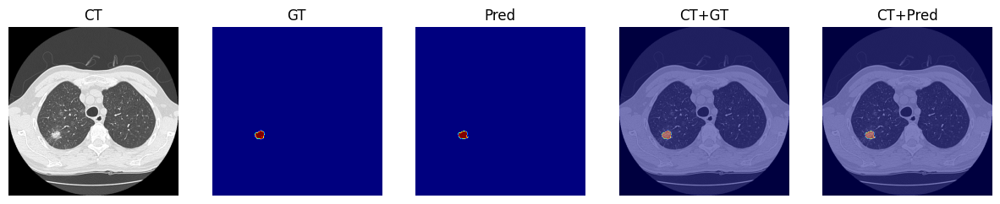

GT: 0 1
Pred: 0.0 1.0


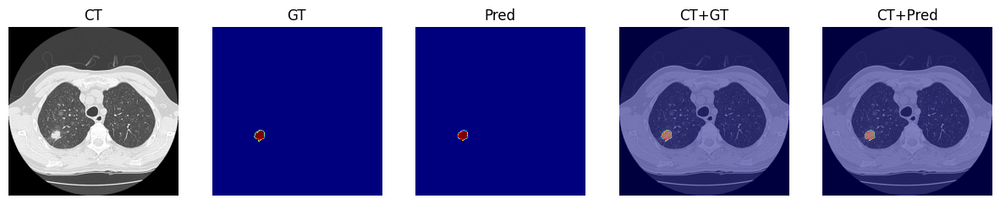

GT: 0 1
Pred: 0.0 1.0


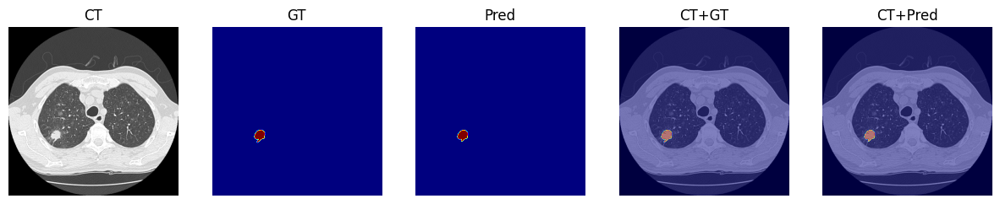

GT: 0 1
Pred: 0.0 1.0


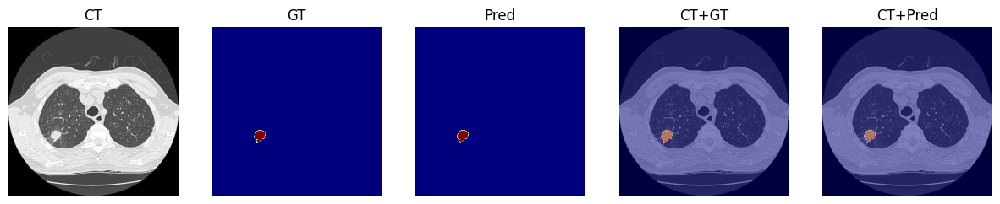

GT: 0 1
Pred: 0.0 1.0


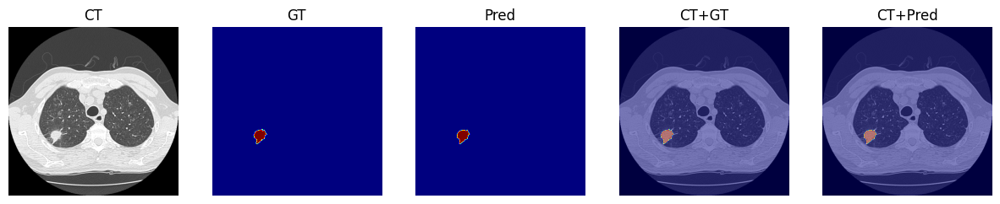

GT: 0 1
Pred: 0.0 1.0


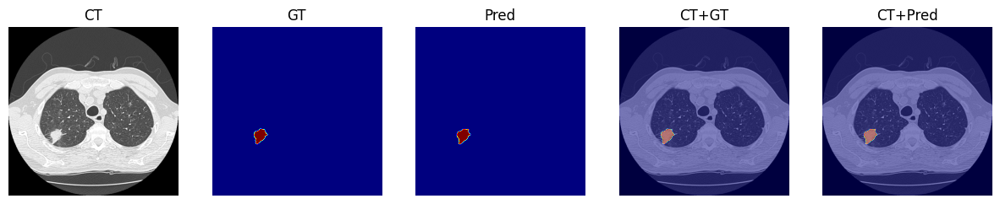

GT: 0 1
Pred: 0.0 1.0


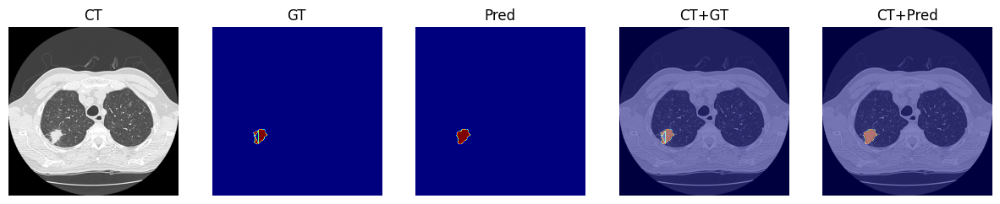

GT: 0 1
Pred: 0.0 1.0


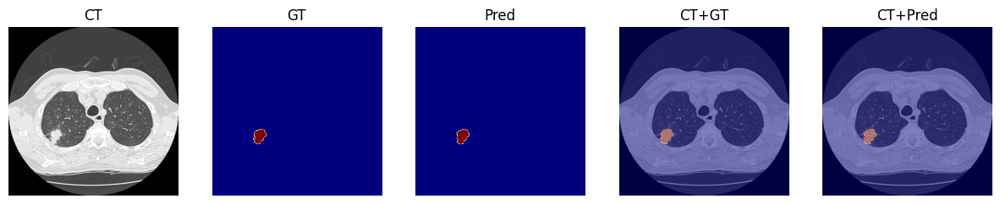

GT: 0 1
Pred: 0.0 1.0


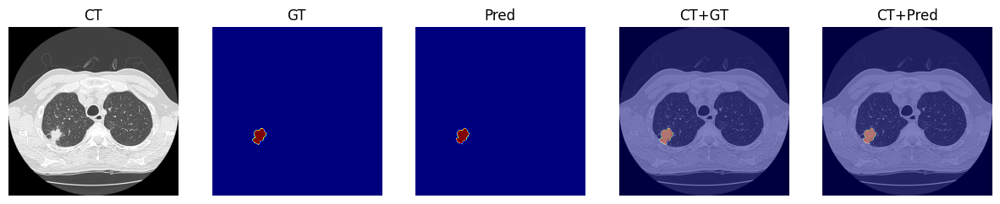

GT: 0 1
Pred: 0.0 1.0


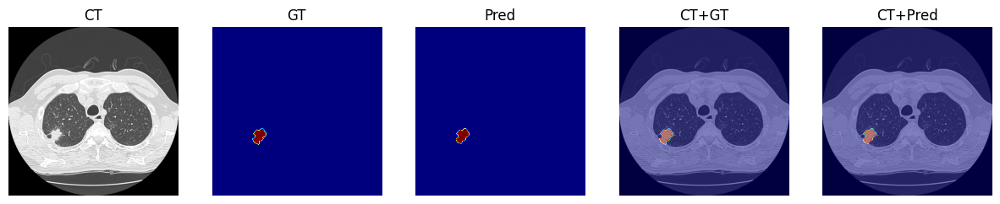

GT: 0 1
Pred: 0.0 1.0


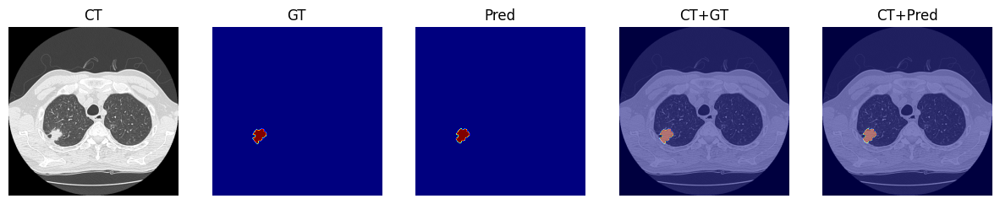

GT: 0 1
Pred: 0.0 1.0


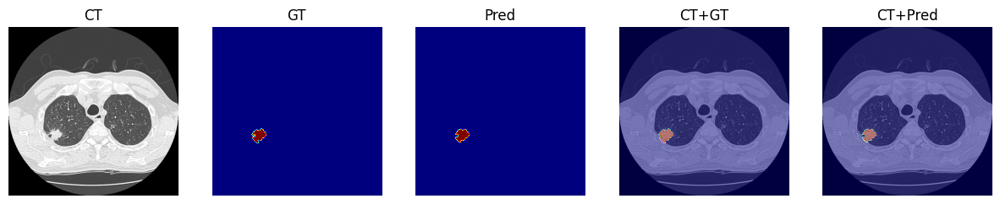

GT: 0 1
Pred: 0.0 1.0


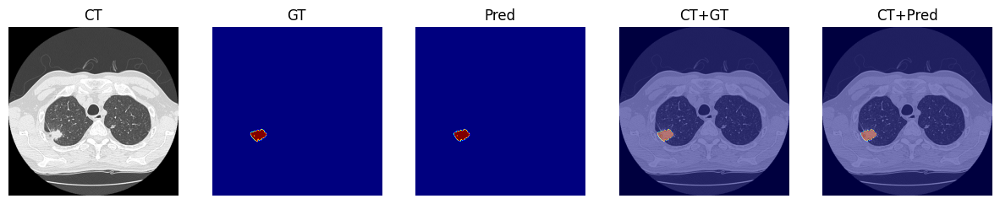

GT: 0 1
Pred: 0.0 1.0


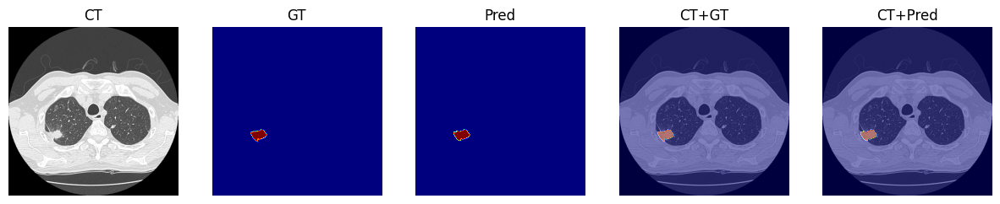

GT: 0 1
Pred: 0.0 1.0


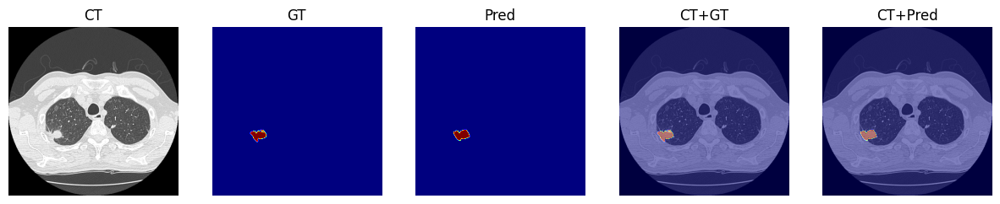

GT: 0 1
Pred: 0.0 1.0


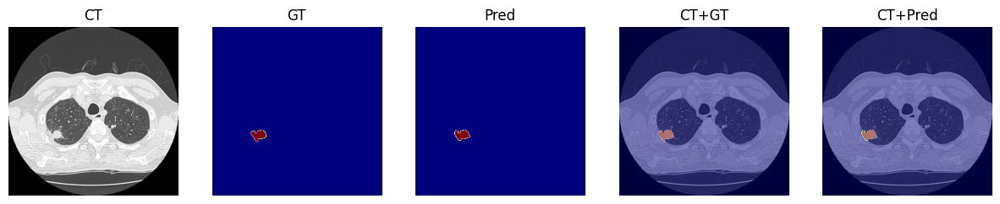

GT: 0 1
Pred: 0.0 1.0


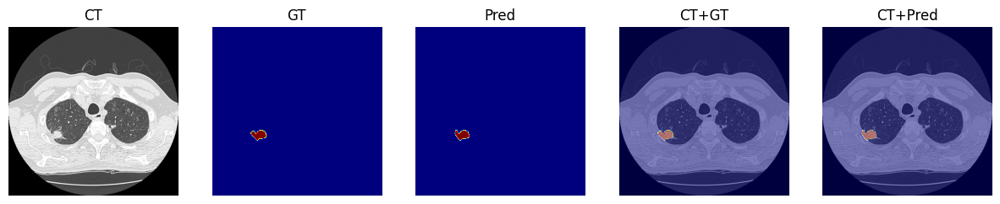

GT: 0 1
Pred: 0.0 1.0


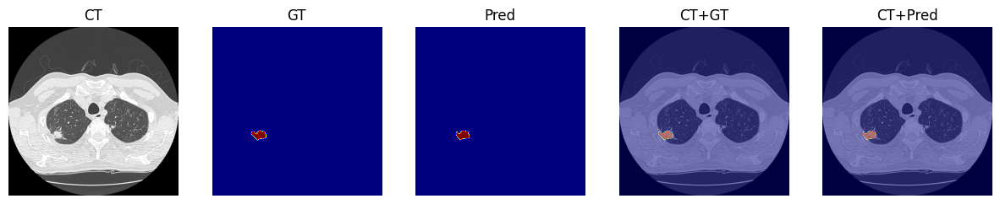

GT: 0 1
Pred: 0.0 1.0


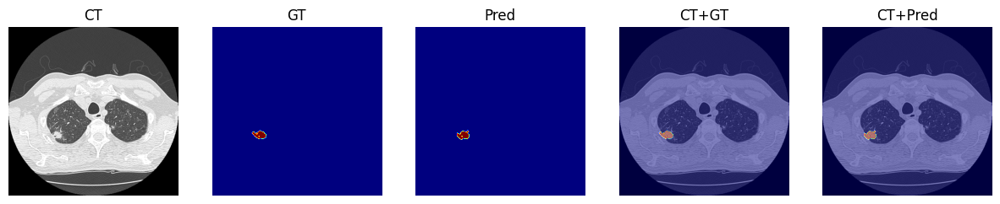

GT: 0 1
Pred: 0.0 1.0


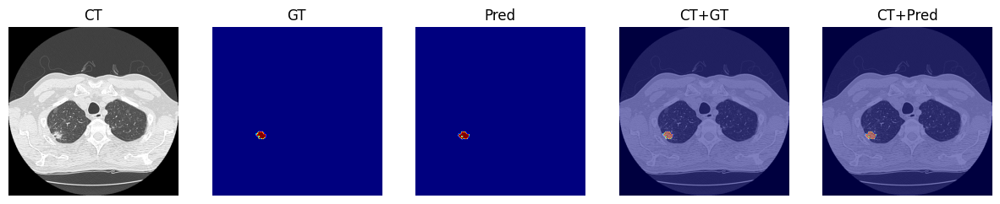

GT: 0 1
Pred: 0.0 1.0


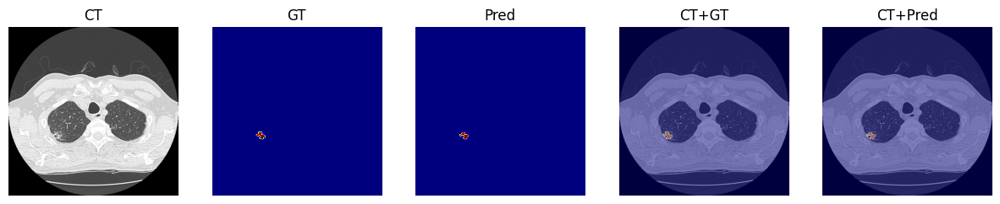

GT: 0 1
Pred: 0.0 1.0


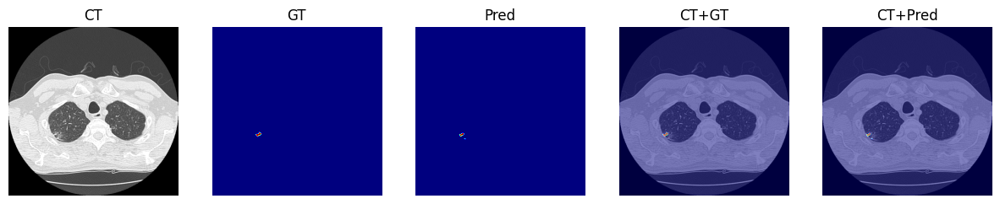

GT: 0 1
Pred: 0.0 1.0


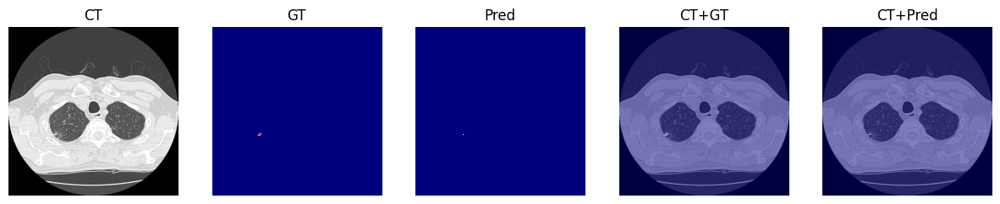

GT: 0 1
Pred: 0.0 1.0


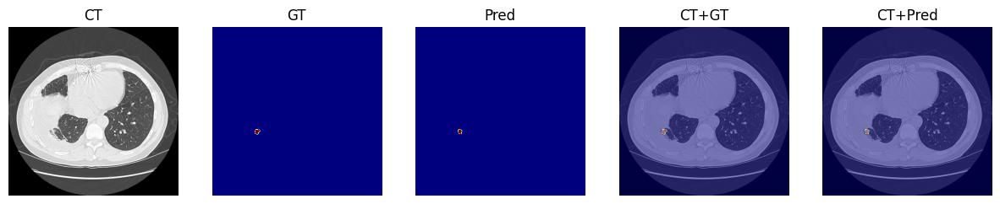

GT: 0 1
Pred: 0.0 1.0


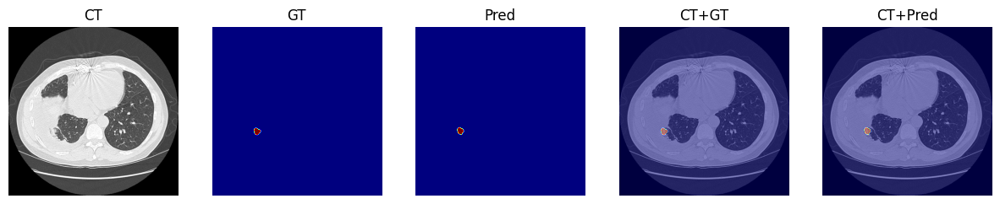

GT: 0 1
Pred: 0.0 1.0


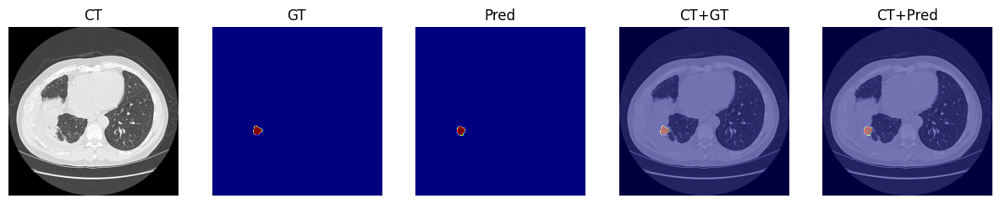

GT: 0 1
Pred: 0.0 1.0


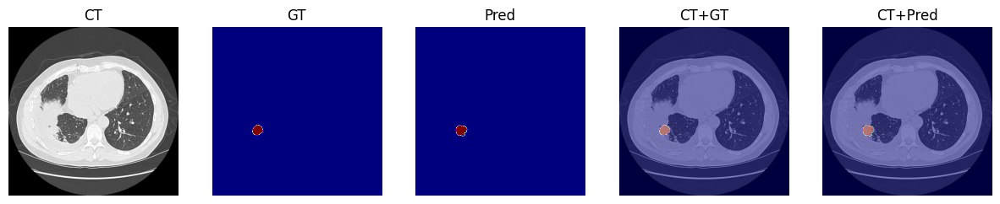

GT: 0 1
Pred: 0.0 1.0


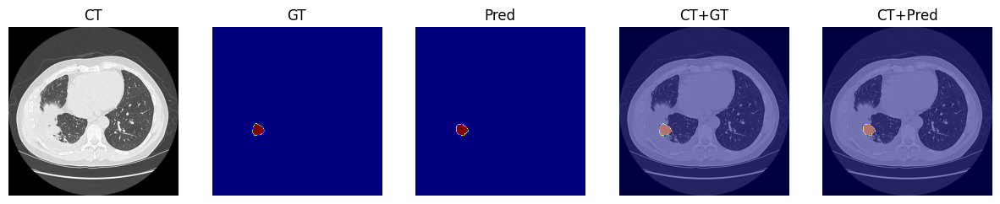

GT: 0 1
Pred: 0.0 1.0


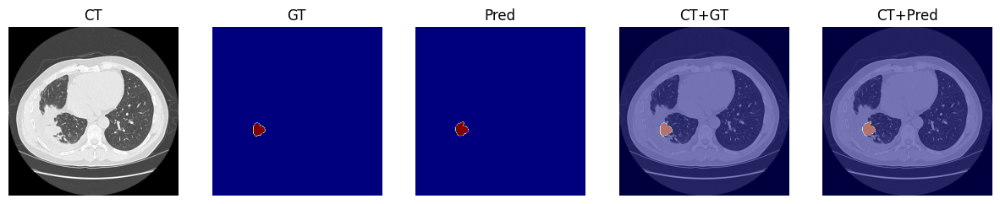

GT: 0 1
Pred: 0.0 1.0


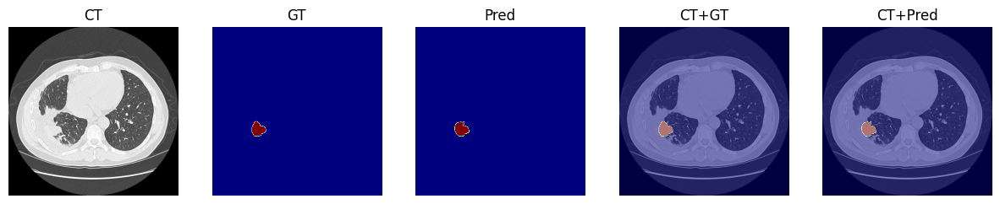

GT: 0 1
Pred: 0.0 1.0


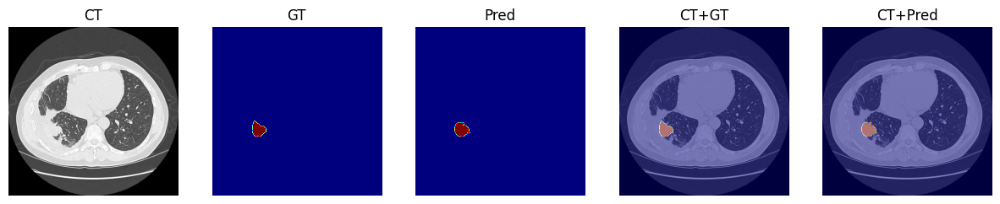

GT: 0 1
Pred: 0.0 1.0


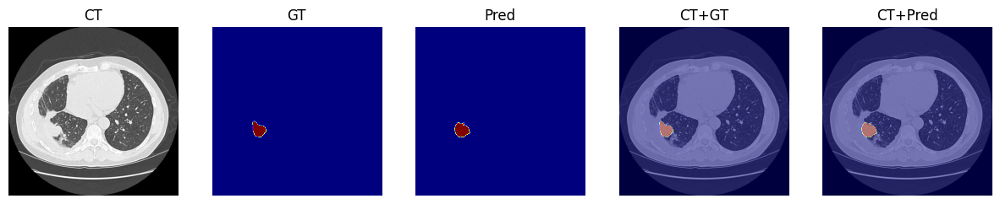

GT: 0 1
Pred: 0.0 1.0


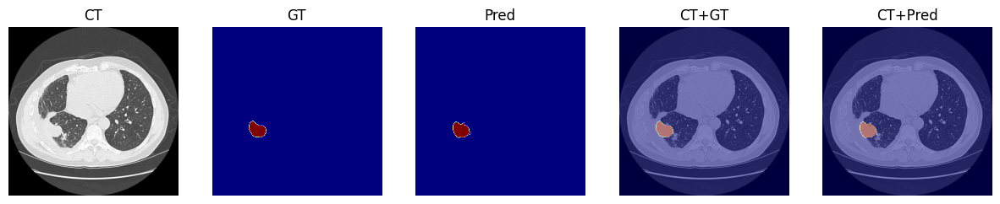

GT: 0 1
Pred: 0.0 1.0


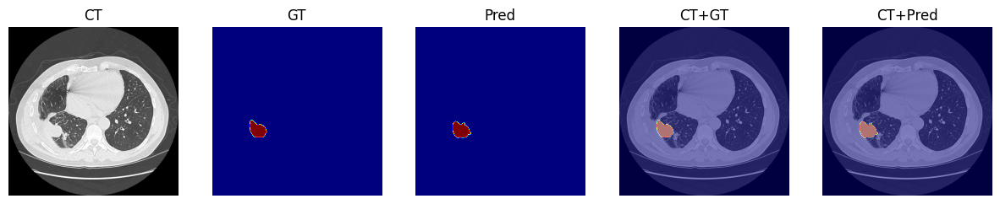

GT: 0 1
Pred: 0.0 1.0


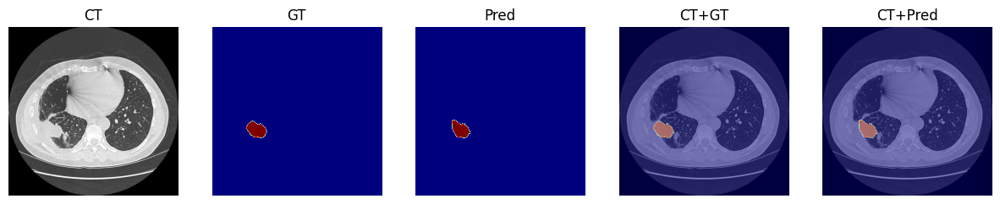

GT: 0 1
Pred: 0.0 1.0


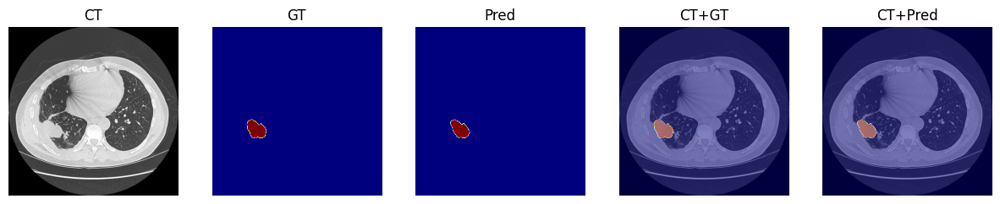

GT: 0 1
Pred: 0.0 1.0


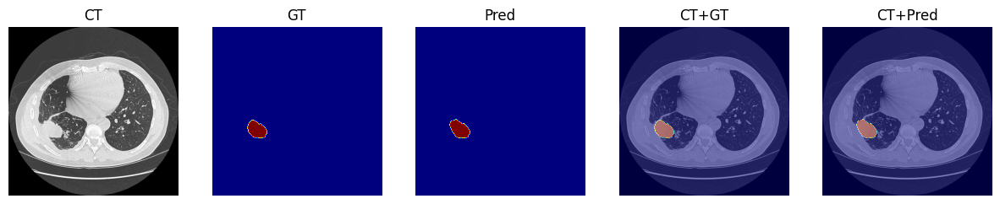

GT: 0 1
Pred: 0.0 1.0


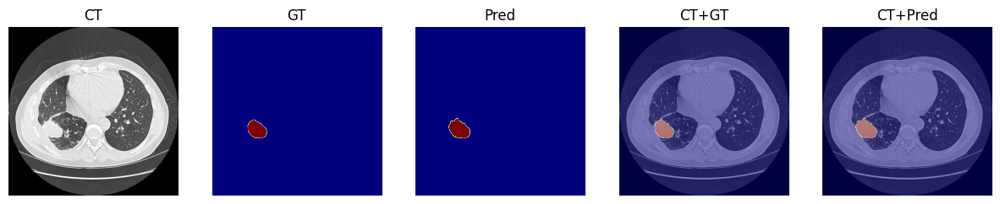

GT: 0 1
Pred: 0.0 1.0


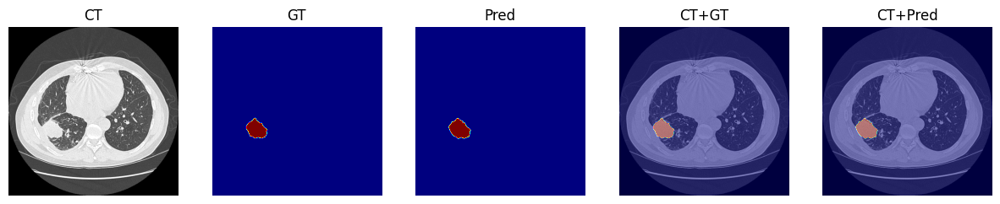

GT: 0 1
Pred: 0.0 1.0


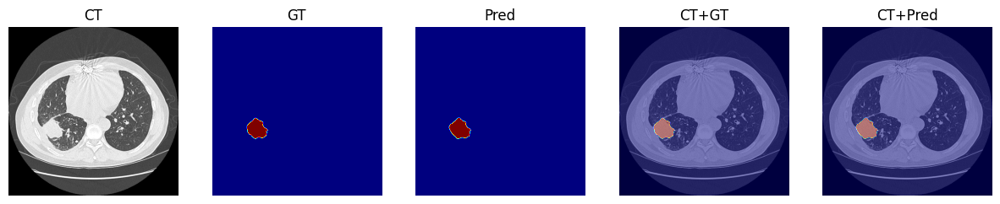

GT: 0 1
Pred: 0.0 1.0


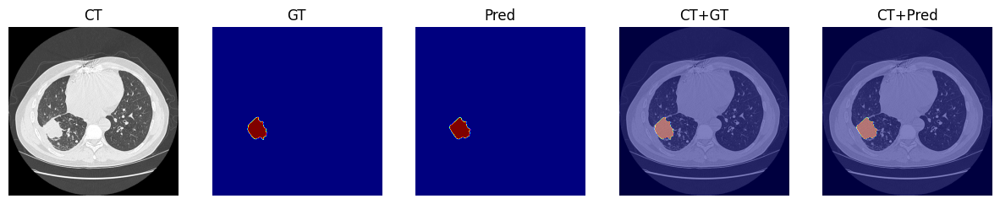

GT: 0 1
Pred: 0.0 1.0


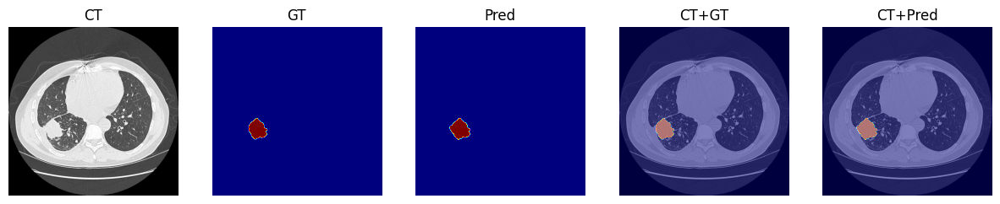

GT: 0 1
Pred: 0.0 1.0


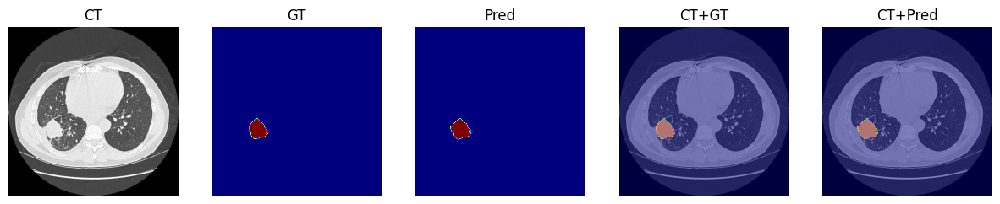

GT: 0 1
Pred: 0.0 1.0


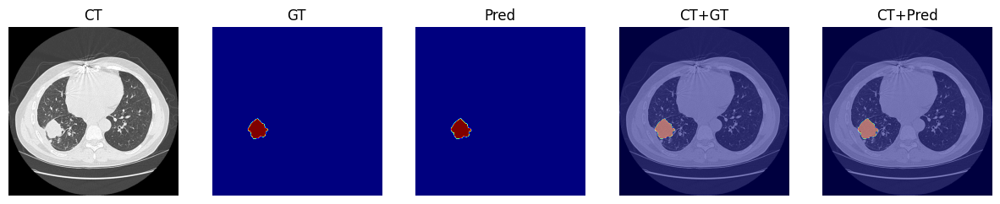

GT: 0 1
Pred: 0.0 1.0


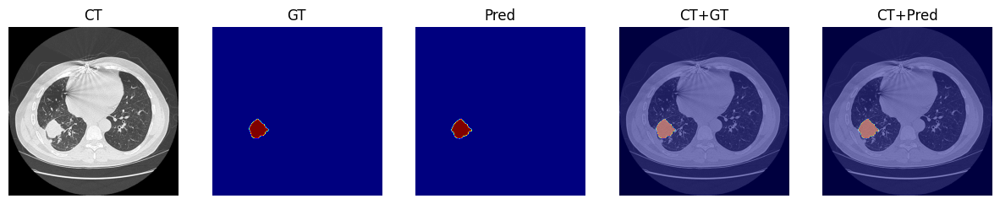

GT: 0 1
Pred: 0.0 1.0


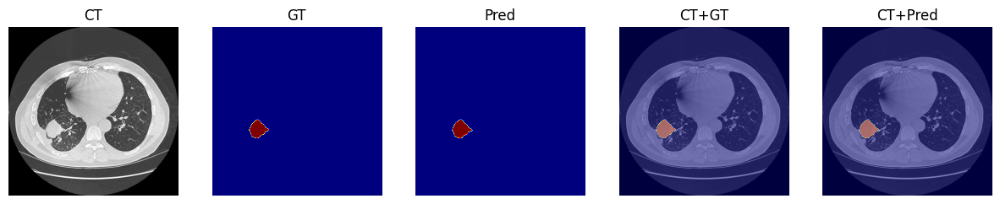

GT: 0 1
Pred: 0.0 1.0


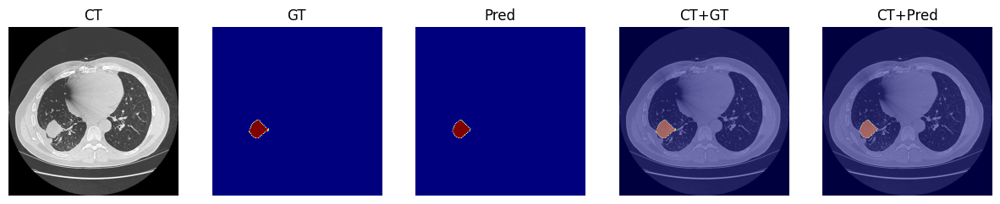

GT: 0 1
Pred: 0.0 1.0


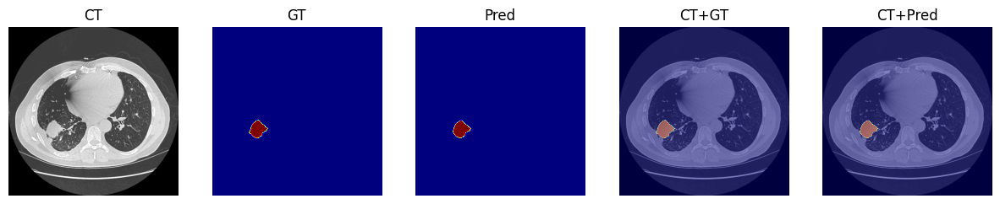

GT: 0 1
Pred: 0.0 1.0


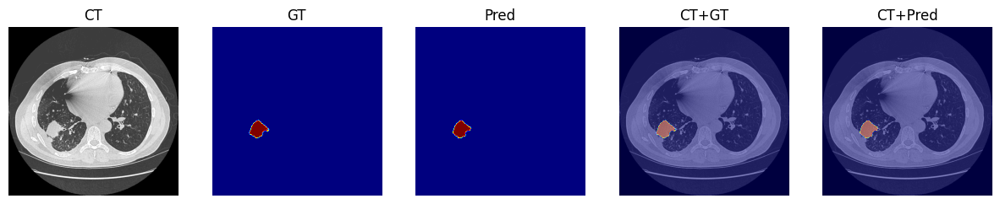

GT: 0 1
Pred: 0.0 1.0


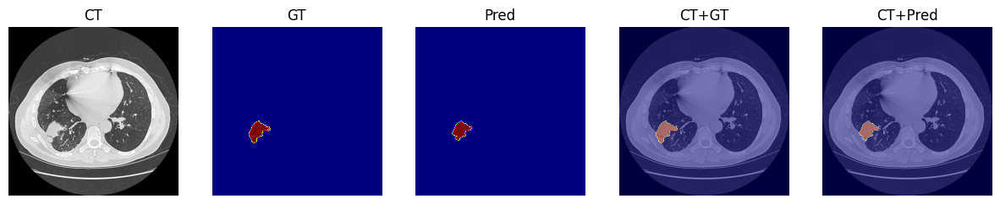

GT: 0 1
Pred: 0.0 1.0


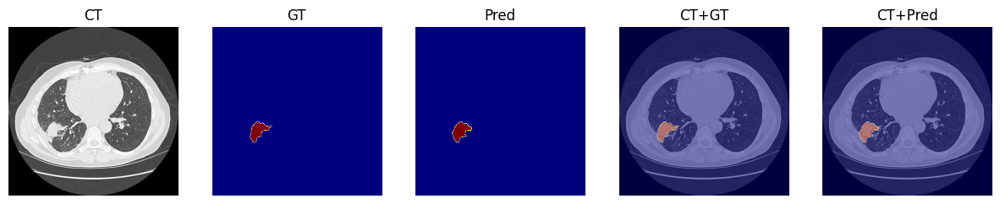

GT: 0 1
Pred: 0.0 1.0


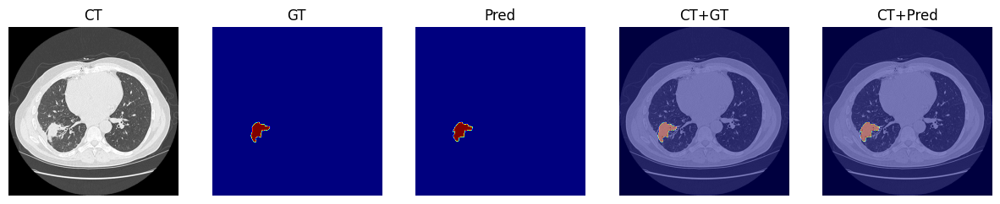

GT: 0 1
Pred: 0.0 1.0


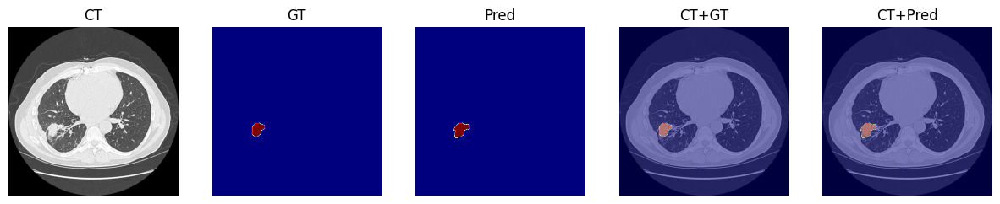

GT: 0 1
Pred: 0.0 1.0


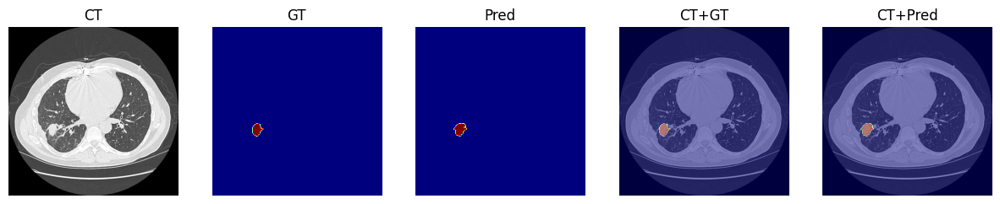

GT: 0 1
Pred: 0.0 1.0


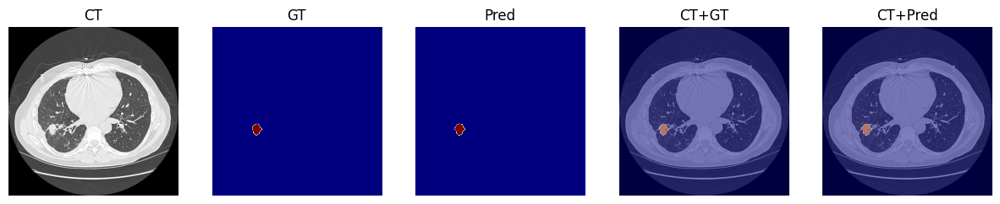

GT: 0 1
Pred: 0.0 1.0


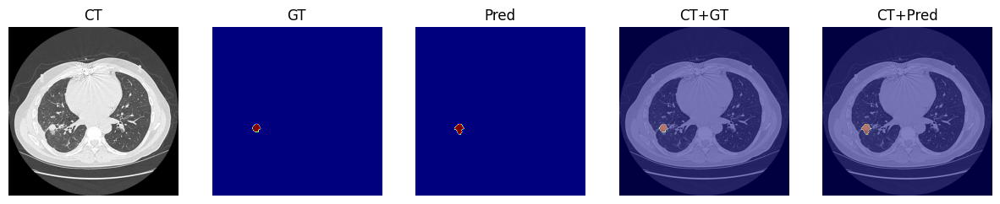

GT: 0 1
Pred: 0.0 1.0


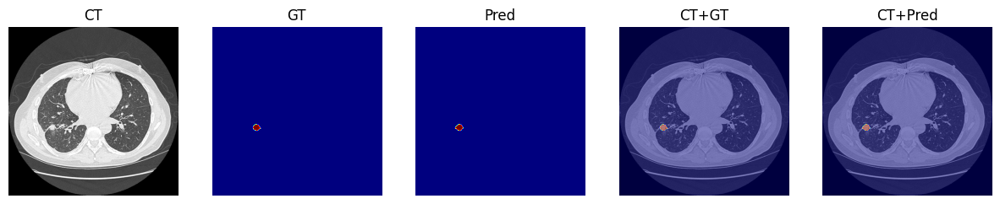

GT: 0 1
Pred: 0.0 1.0


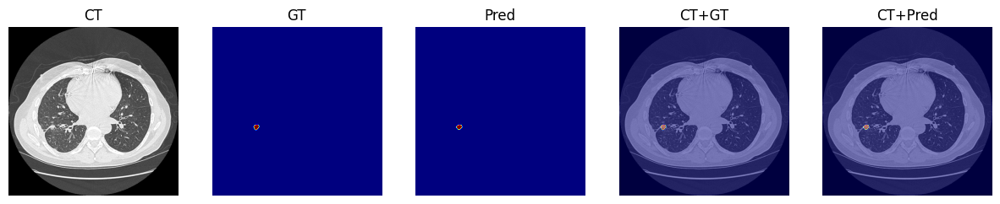

GT: 0 1
Pred: 0.0 1.0


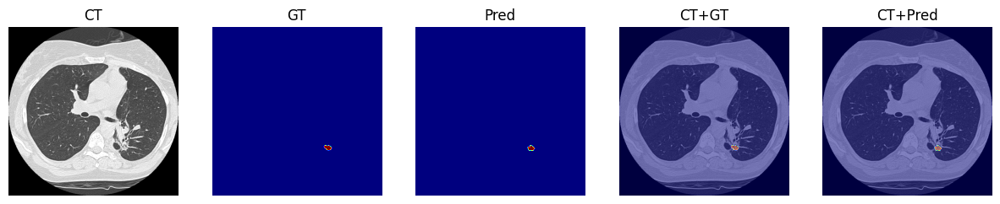

GT: 0 1
Pred: 0.0 1.0


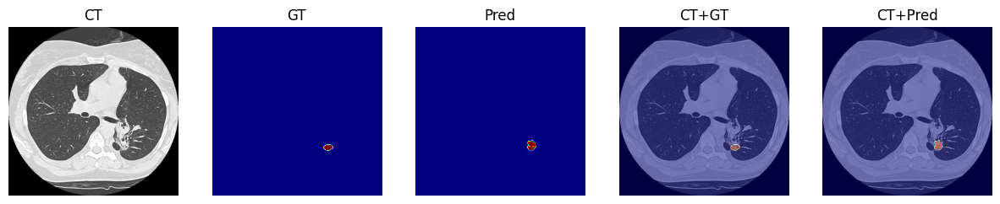

GT: 0 1
Pred: 0.0 1.0


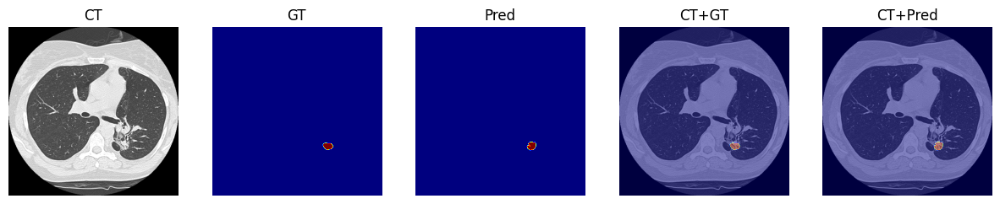

GT: 0 1
Pred: 0.0 1.0


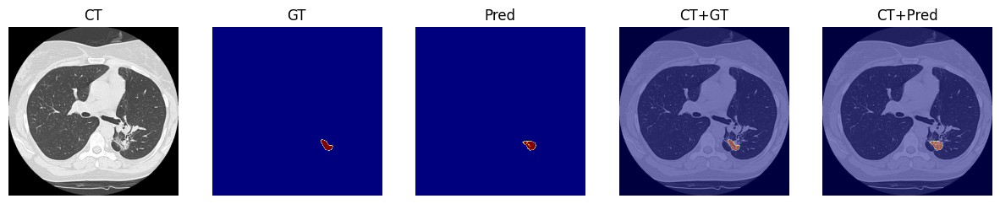

GT: 0 1
Pred: 0.0 1.0


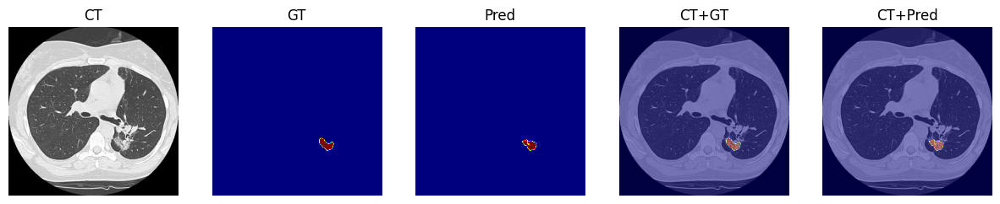

GT: 0 1
Pred: 0.0 1.0


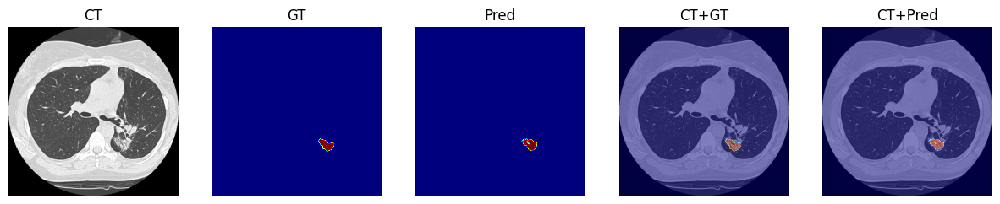

GT: 0 1
Pred: 0.0 1.0


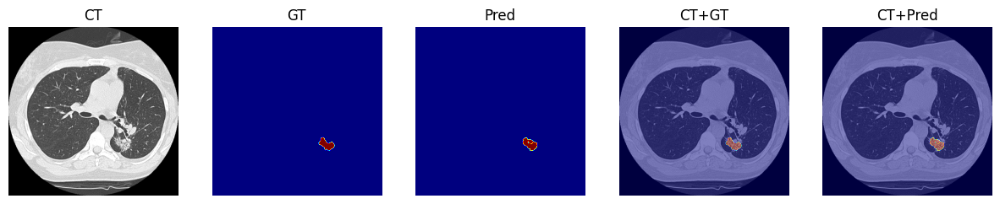

GT: 0 1
Pred: 0.0 1.0


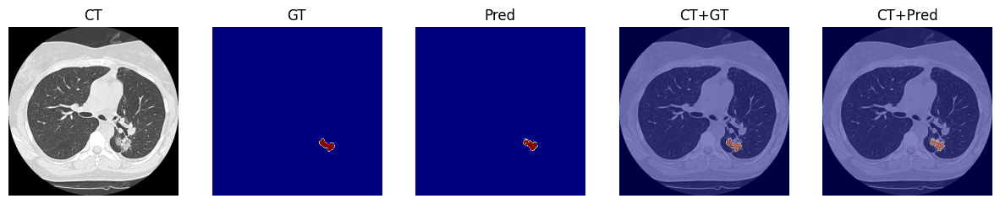

GT: 0 1
Pred: 0.0 1.0


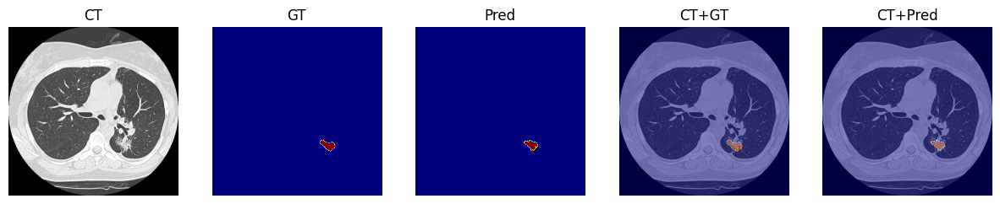

GT: 0 1
Pred: 0.0 1.0


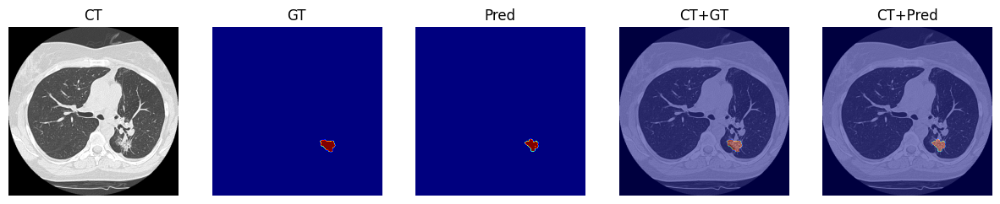

GT: 0 1
Pred: 0.0 1.0


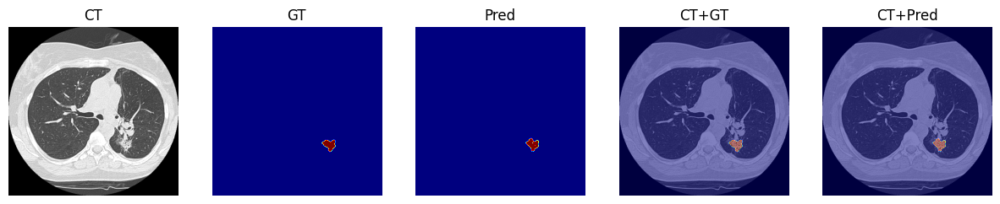

GT: 0 1
Pred: 0.0 1.0


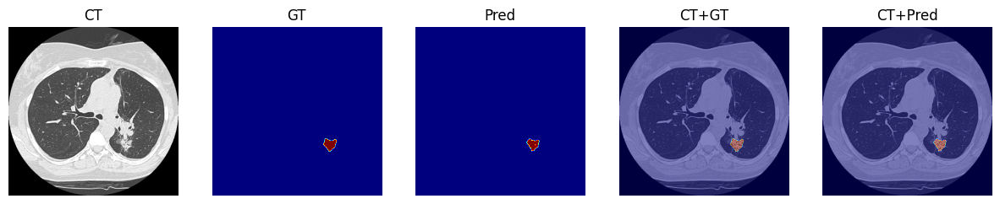

GT: 0 1
Pred: 0.0 1.0


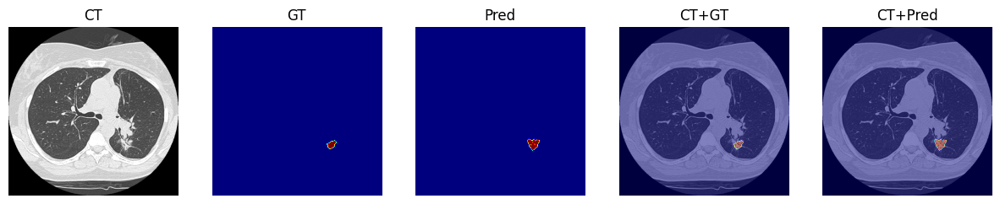

GT: 0 1
Pred: 0.0 1.0


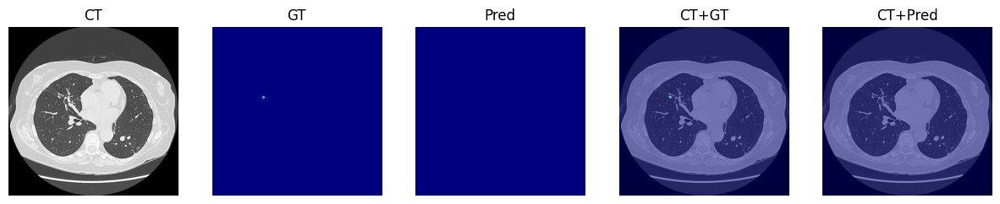

GT: 0 1
Pred: 0.0 0.0


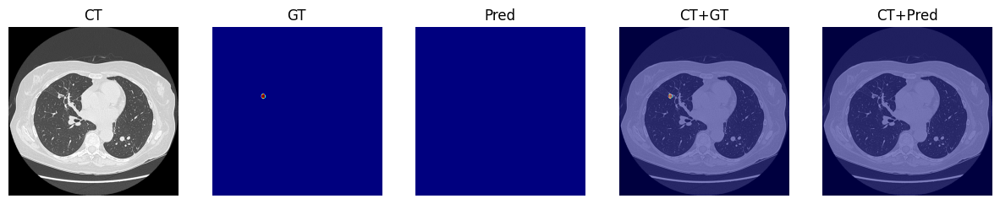

GT: 0 1
Pred: 0.0 0.0


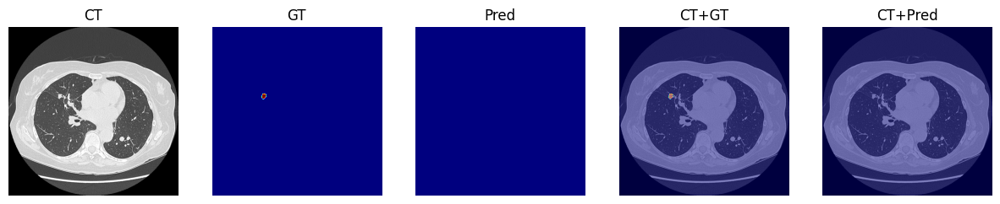

GT: 0 1
Pred: 0.0 0.0


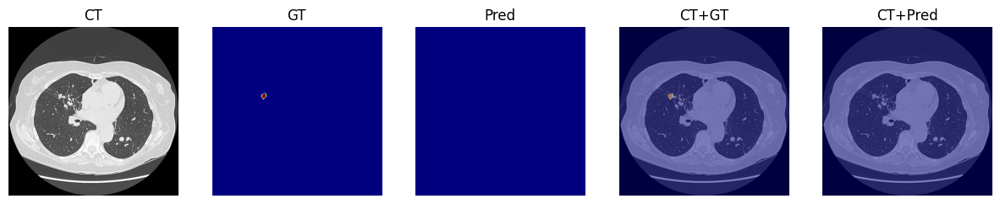

GT: 0 1
Pred: 0.0 0.0


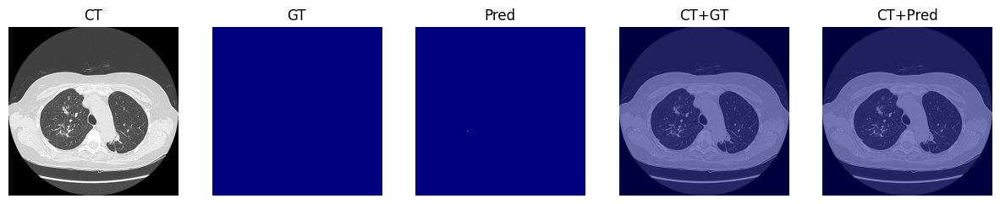

GT: 0 0
Pred: 0.0 1.0


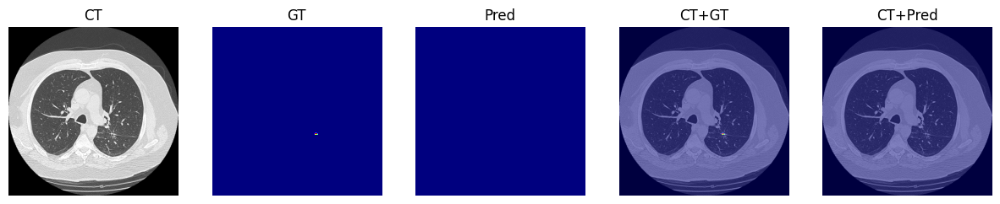

GT: 0 1
Pred: 0.0 0.0


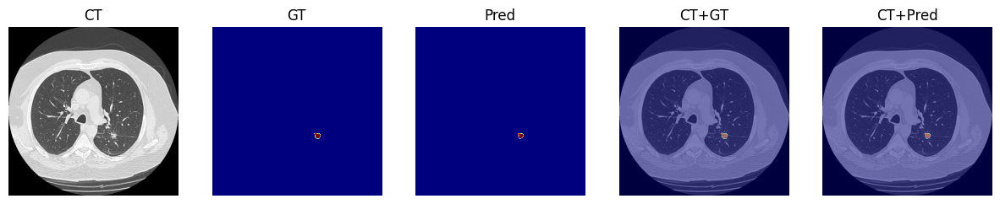

GT: 0 1
Pred: 0.0 1.0


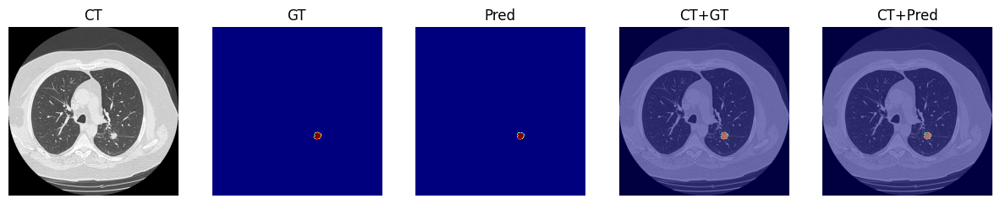

GT: 0 1
Pred: 0.0 1.0


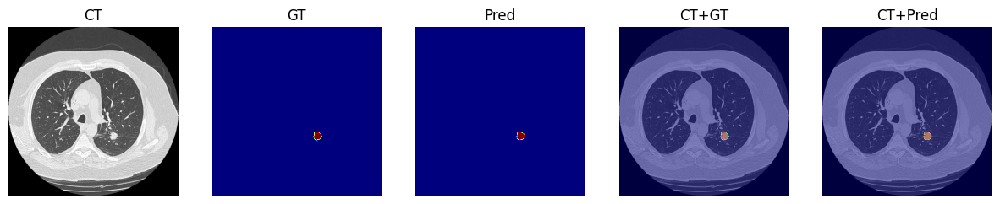

GT: 0 1
Pred: 0.0 1.0


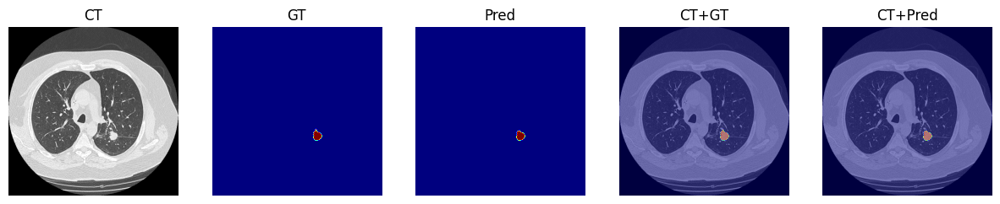

GT: 0 1
Pred: 0.0 1.0


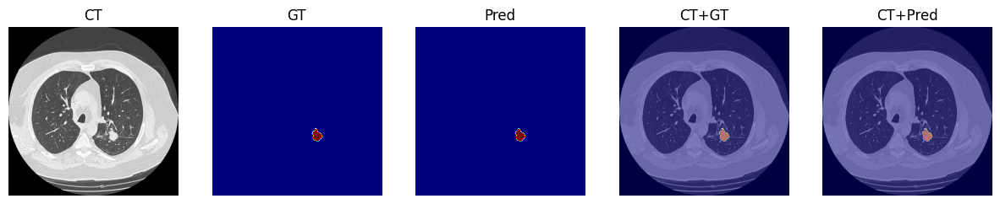

GT: 0 1
Pred: 0.0 1.0


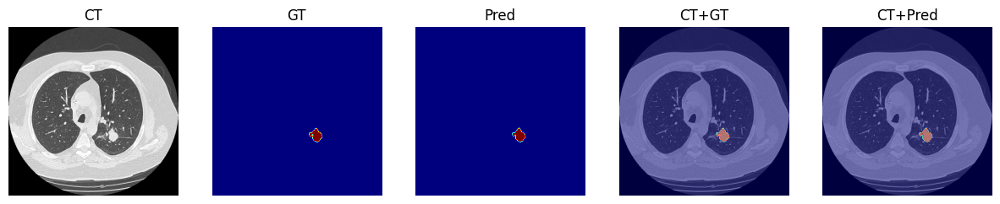

GT: 0 1
Pred: 0.0 1.0


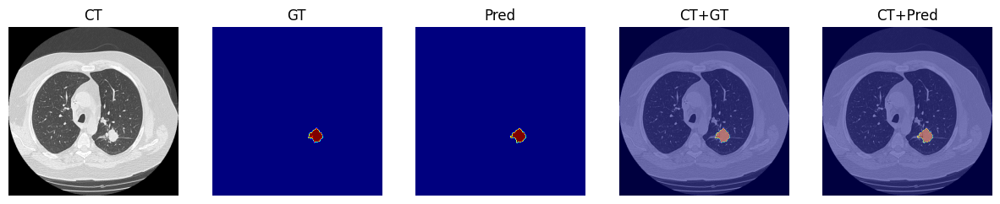

GT: 0 1
Pred: 0.0 1.0


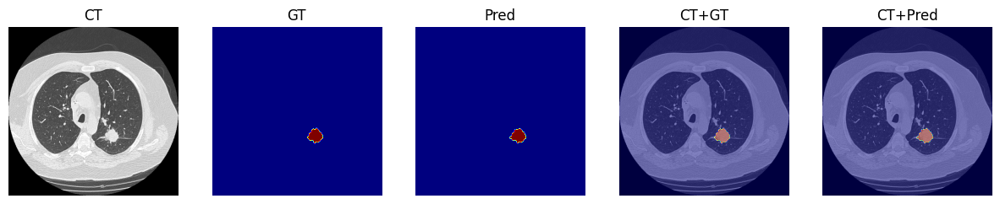

GT: 0 1
Pred: 0.0 1.0


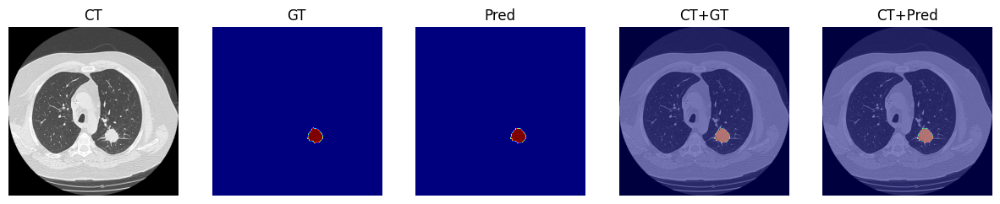

GT: 0 1
Pred: 0.0 1.0


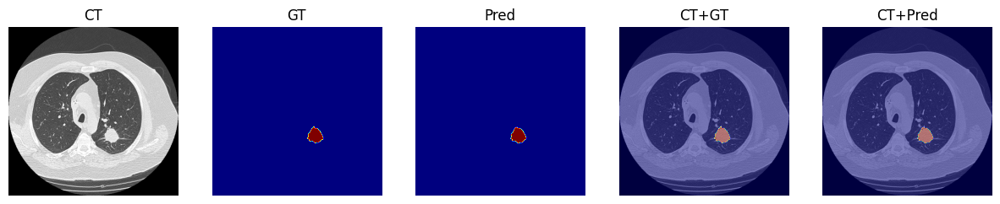

GT: 0 1
Pred: 0.0 1.0


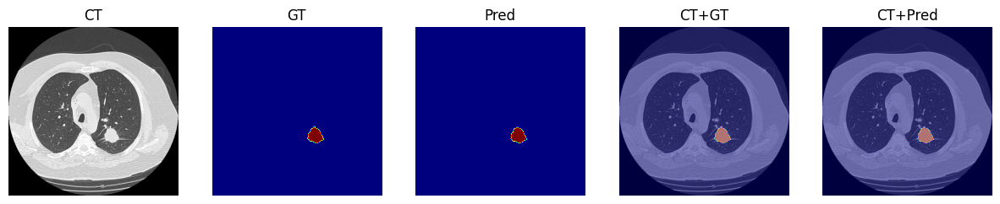

GT: 0 1
Pred: 0.0 1.0


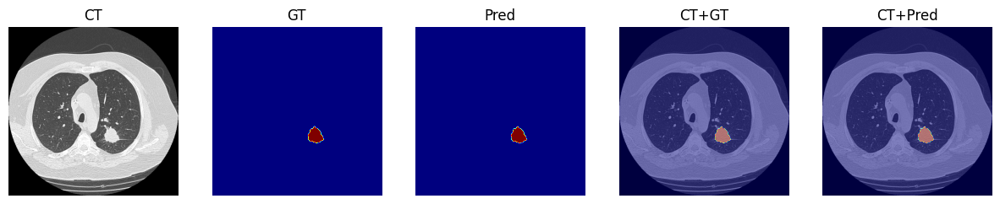

GT: 0 1
Pred: 0.0 1.0


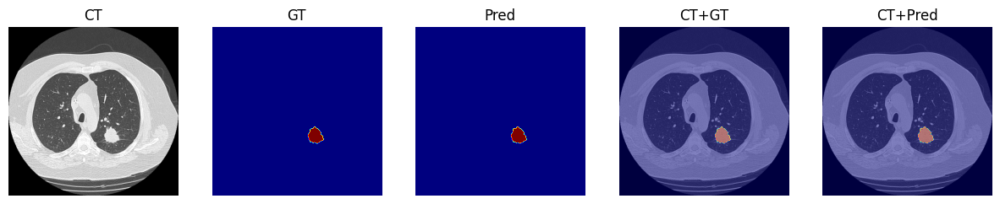

GT: 0 1
Pred: 0.0 1.0


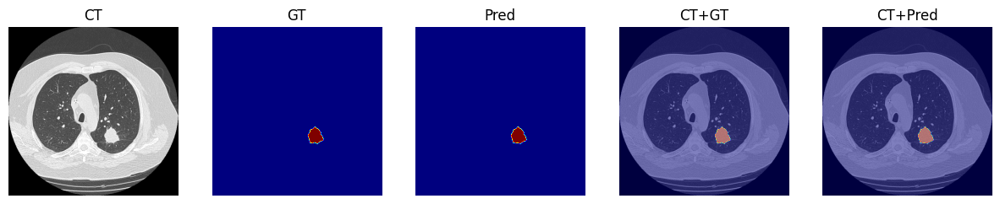

GT: 0 1
Pred: 0.0 1.0


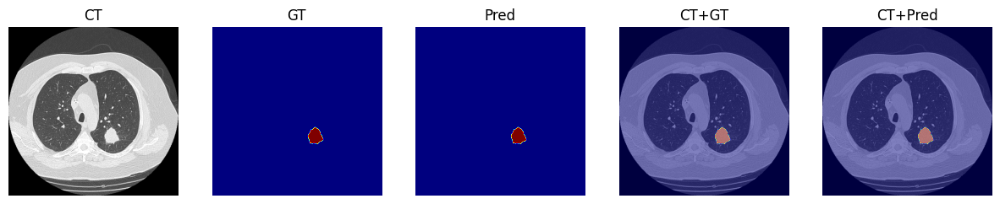

GT: 0 1
Pred: 0.0 1.0


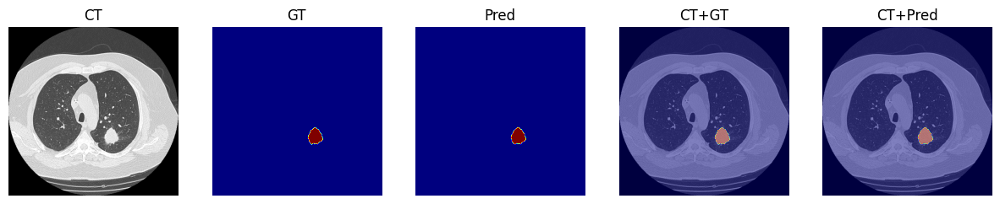

GT: 0 1
Pred: 0.0 1.0


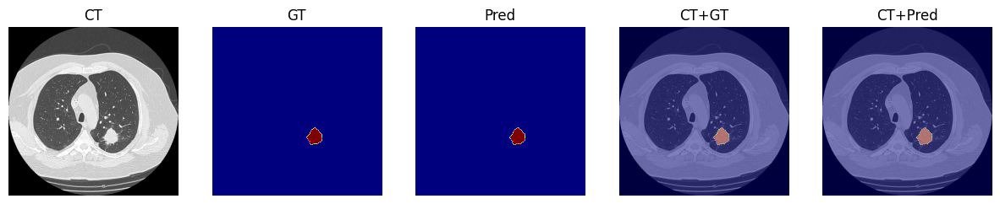

GT: 0 1
Pred: 0.0 1.0


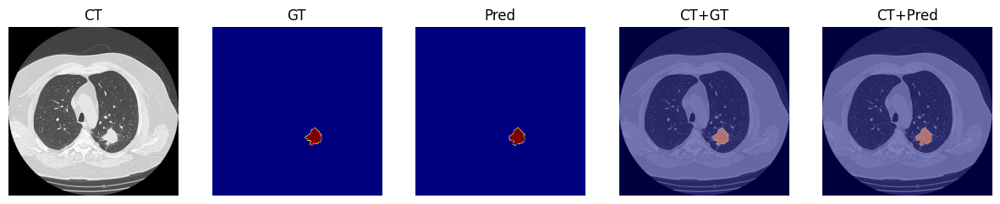

GT: 0 1
Pred: 0.0 1.0


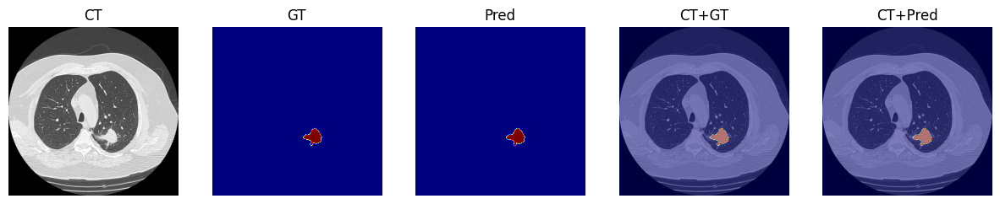

GT: 0 1
Pred: 0.0 1.0


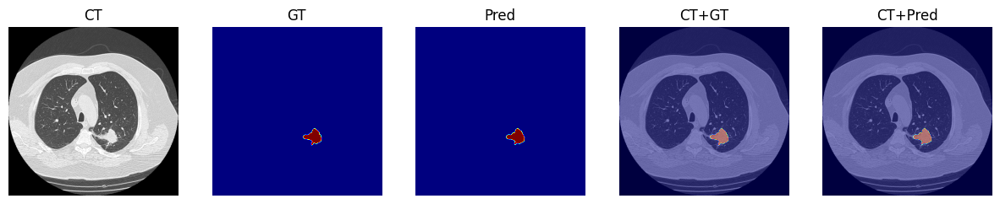

GT: 0 1
Pred: 0.0 1.0


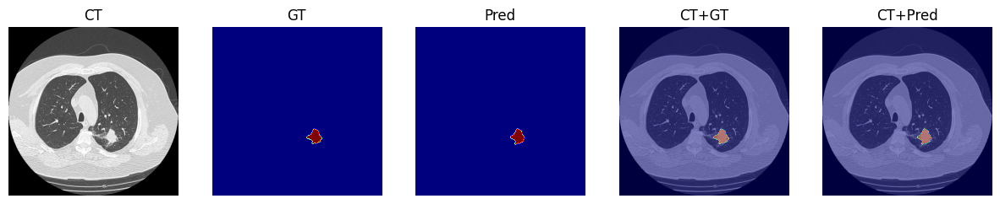

GT: 0 1
Pred: 0.0 1.0


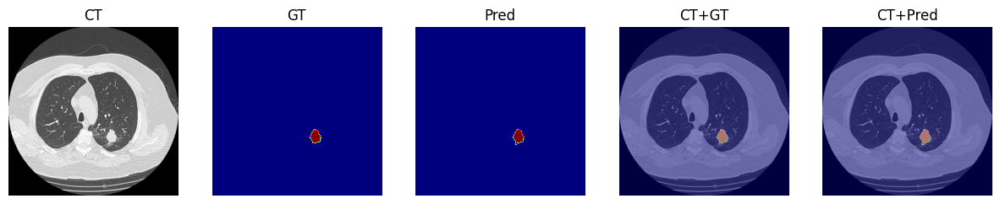

GT: 0 1
Pred: 0.0 1.0


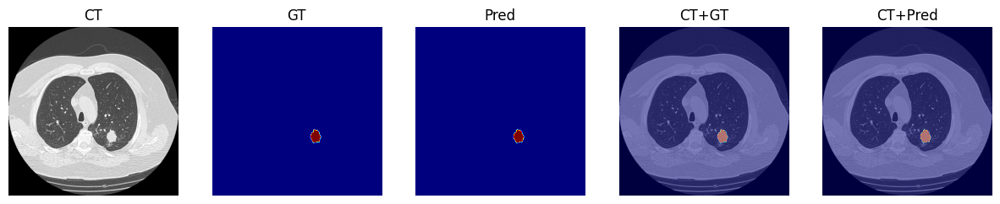

GT: 0 1
Pred: 0.0 1.0


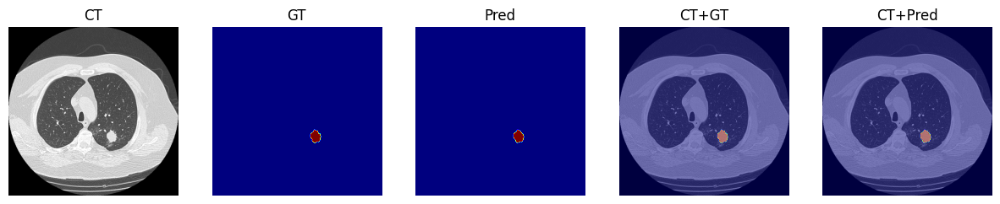

GT: 0 1
Pred: 0.0 1.0


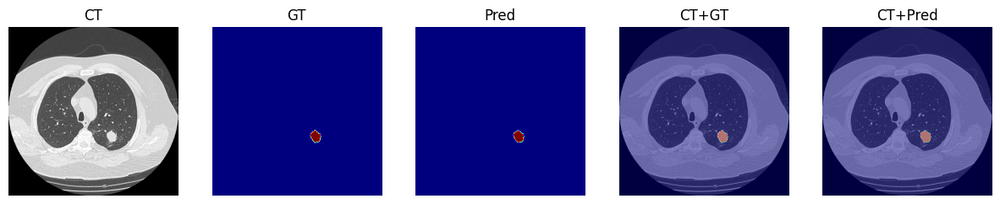

GT: 0 1
Pred: 0.0 1.0


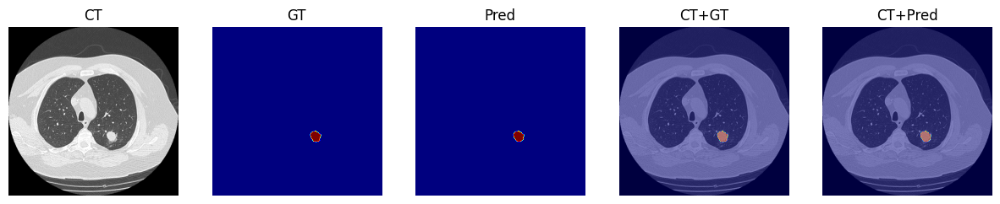

GT: 0 1
Pred: 0.0 1.0


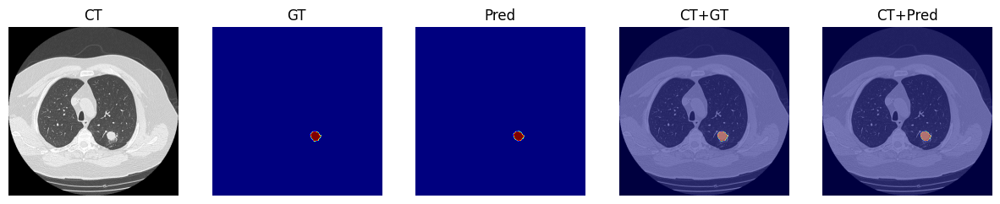

GT: 0 1
Pred: 0.0 1.0


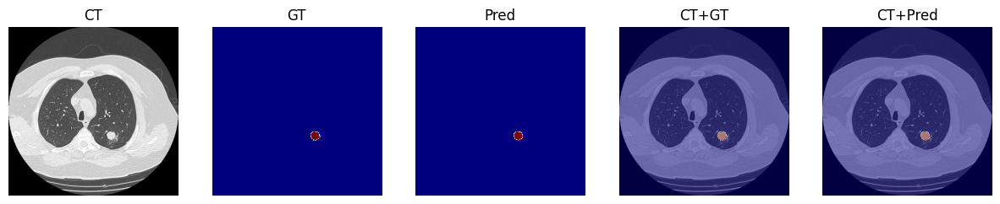

GT: 0 1
Pred: 0.0 1.0


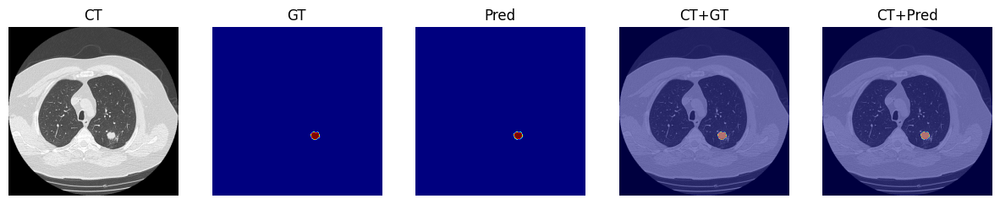

GT: 0 1
Pred: 0.0 1.0


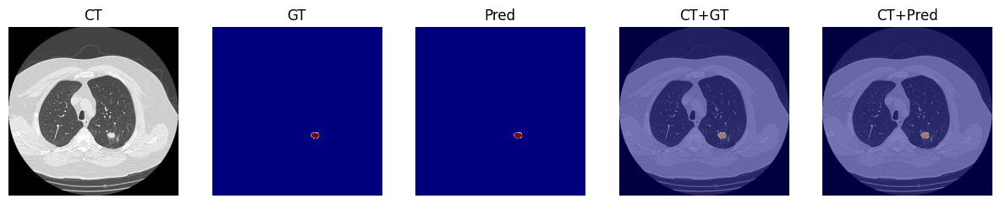

GT: 0 1
Pred: 0.0 1.0


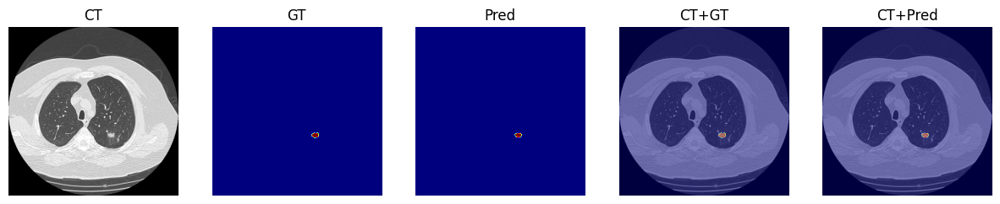

GT: 0 1
Pred: 0.0 1.0


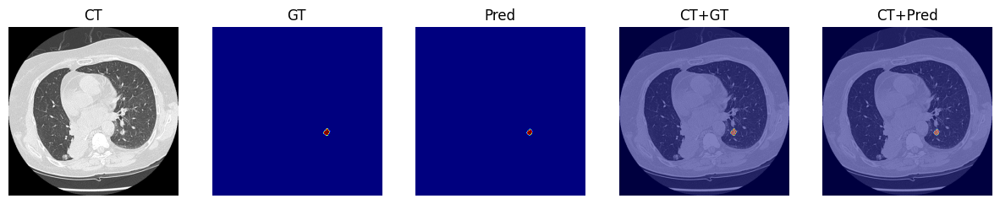

GT: 0 1
Pred: 0.0 1.0


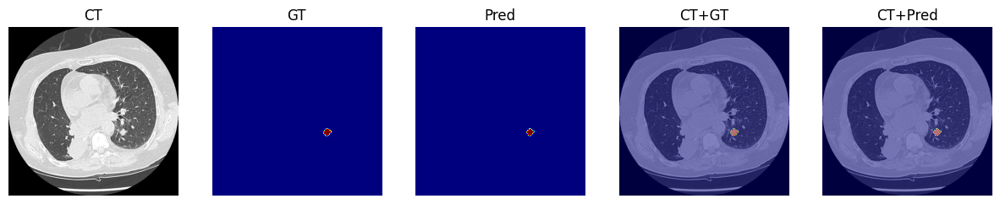

GT: 0 1
Pred: 0.0 1.0


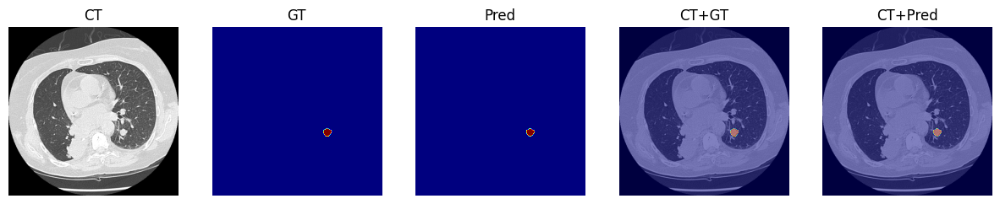

GT: 0 1
Pred: 0.0 1.0


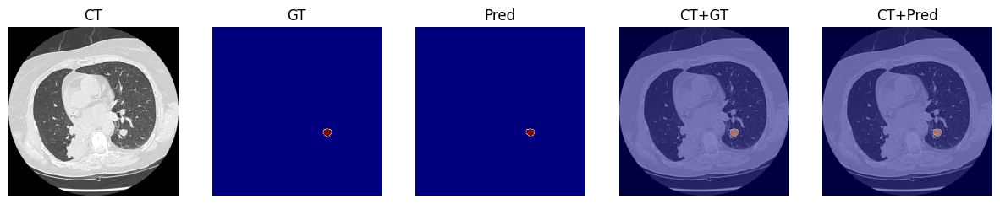

GT: 0 1
Pred: 0.0 1.0


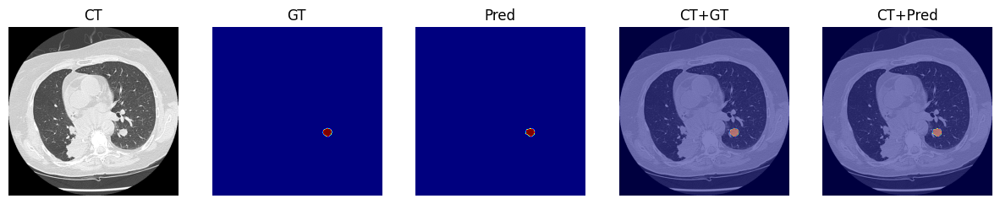

GT: 0 1
Pred: 0.0 1.0


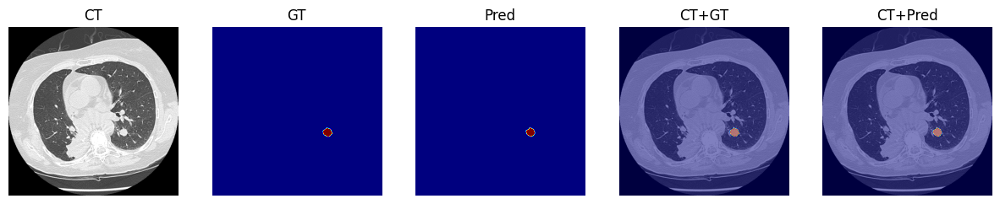

GT: 0 1
Pred: 0.0 1.0


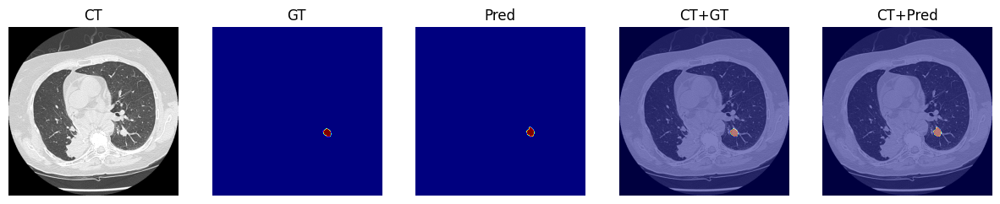

GT: 0 1
Pred: 0.0 1.0


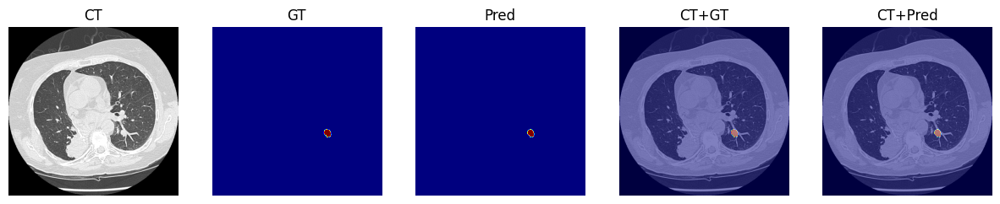

GT: 0 1
Pred: 0.0 1.0


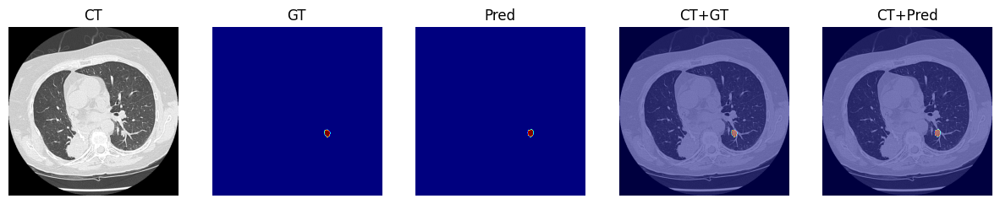

GT: 0 1
Pred: 0.0 1.0


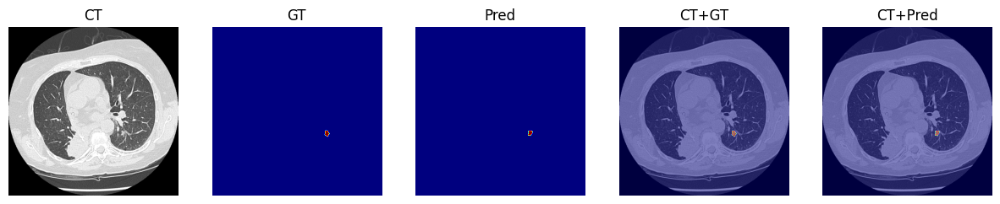

GT: 0 1
Pred: 0.0 1.0


In [13]:
for _slice in range(len(x_test)):
    image = x_test[_slice,...]
    target = y_test[_slice,...]
    prediction = pred_test[_slice,...]

    if prediction.max()==0 and target.max()==0:
        continue
    
    plt.figure(figsize=(15,15))
    plt.subplot(151)
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.title('CT')
    plt.subplot(152)
    plt.imshow(target, cmap='jet')
    plt.axis('off')
    plt.title('GT')
    plt.subplot(153)
    plt.imshow(prediction, cmap='jet')
    plt.axis('off')
    plt.title('Pred')
    plt.subplot(154)
    plt.imshow(image, cmap='gray')
    plt.imshow(target, cmap='jet', alpha=.5)
    plt.title('CT+GT')
    plt.axis('off')
    plt.subplot(155)
    plt.imshow(image, cmap='gray')
    plt.imshow(prediction, cmap='jet', alpha=.5)
    plt.axis('off')
    plt.title('CT+Pred')
    plt.show()

    print('GT:', target.min(), target.max())
    print('Pred:', prediction.min(), prediction.max())